# Exploring the KITTI 3D object detection data set
## From directory structure to 2D bounding boxes


In this notebook we explore the 2d bounding box labels of the Kitti 3d detection dataset.

## Images

In [1]:
!pip3 install tabulate


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import sys
import cv2
import matplotlib.pyplot as plt

import numpy as np
from tabulate import tabulate

from app import app
from kitti.data import read_label_3d, get_image_names

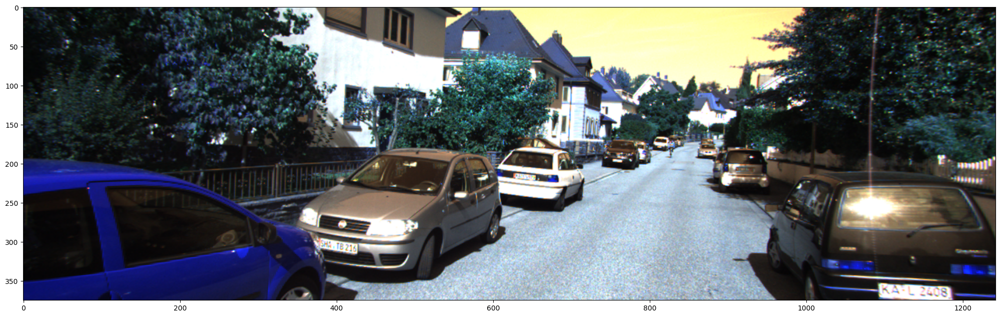

In [19]:
plt.rcParams['figure.figsize'] = (25, 14)

image_names = get_image_names(app.DataConfig.image_dir)
f = image_names[8]

image_file = app.DataConfig.image_dir + f
calibration_file = app.DataConfig.calibration_dir + f.replace('png', 'txt')
label_file = app.DataConfig.label_dir + f.replace('png', 'txt')
labels = read_label_3d(label_file)
img = cv2.imread(image_file)

plt.imshow(img)

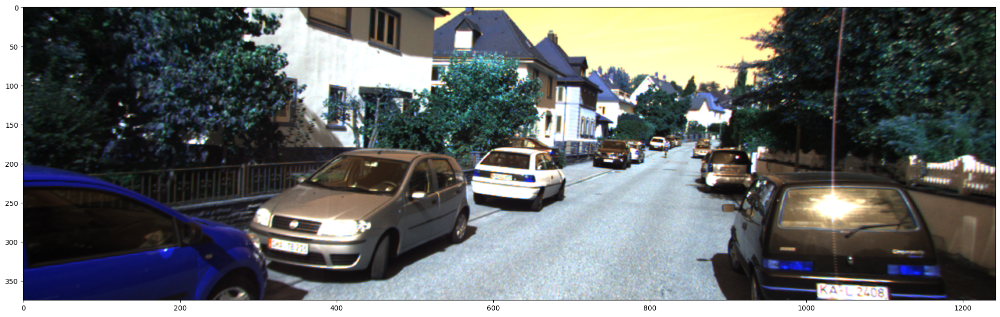

In [20]:
img3 = cv2.imread(image_file.replace('image_2', 'image_3'))
plt.imshow(img3)

## Stereo camera 

#### Overlaying images of left and right camera

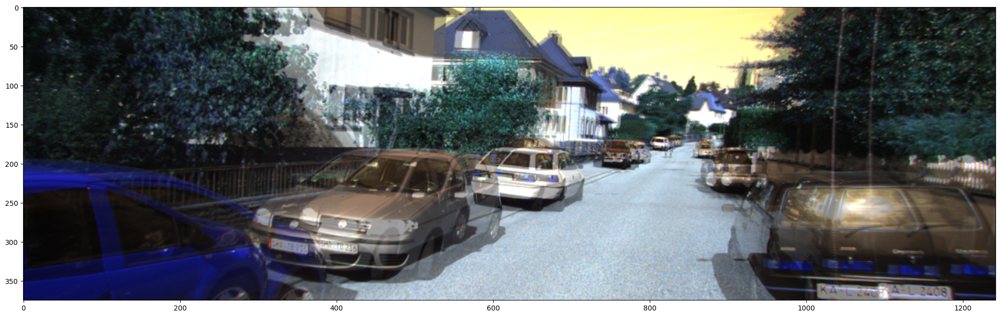

In [21]:
combined = cv2.addWeighted(img,0.5,img3,0.5,0)
plt.imshow(combined)

### The label files

In [22]:
label_file

'data/detection/training/label_2/000008.txt'

In [23]:
# Display file contents using Python (recommended)
with open(label_file, 'r') as file:
    print(file.read())

Car 0.88 3 -0.69 0.00 192.37 402.31 374.00 1.60 1.57 3.23 -2.70 1.74 3.68 -1.29
Car 0.00 1 2.04 334.85 178.94 624.50 372.04 1.57 1.50 3.68 -1.17 1.65 7.86 1.90
Car 0.34 3 -1.84 937.29 197.39 1241.00 374.00 1.39 1.44 3.08 3.81 1.64 6.15 -1.31
Car 0.00 1 -1.33 597.59 176.18 720.90 261.14 1.47 1.60 3.66 1.07 1.55 14.44 -1.25
Car 0.00 0 1.74 741.18 168.83 792.25 208.43 1.70 1.63 4.08 7.24 1.55 33.20 1.95
Car 0.00 0 -1.65 884.52 178.31 956.41 240.18 1.59 1.59 2.47 8.48 1.75 19.96 -1.25
DontCare -1 -1 -10 800.38 163.67 825.45 184.07 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 859.58 172.34 886.26 194.51 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 801.81 163.96 825.20 183.59 -1 -1 -1 -1000 -1000 -1000 -10
DontCare -1 -1 -10 826.87 162.28 845.84 178.86 -1 -1 -1 -1000 -1000 -1000 -10



In [24]:
print(sys.executable)

c:\Users\Lenovo\AppData\Local\Programs\Python\Python312\python.exe


In [25]:
print(tabulate(labels, headers='keys'))

    label       truncated    occluded    alpha    bbox_xmin    bbox_ymin    bbox_xmax    bbox_ymax    dim_height    dim_width    dim_length     loc_x     loc_y     loc_z    rotation_y    score
--  --------  -----------  ----------  -------  -----------  -----------  -----------  -----------  ------------  -----------  ------------  --------  --------  --------  ------------  -------
 0  Car              0.88           3    -0.69         0          192.37       402.31       374             1.6          1.57          3.23     -2.7       1.74      3.68         -1.29      nan
 1  Car              0              1     2.04       334.85       178.94       624.5        372.04          1.57         1.5           3.68     -1.17      1.65      7.86          1.9       nan
 2  Car              0.34           3    -1.84       937.29       197.39      1241          374             1.39         1.44          3.08      3.81      1.64      6.15         -1.31      nan
 3  Car              0             

## Exploring 2d labels

In [26]:
coordinates = labels[[col for col in labels.columns if col.startswith('bbox')]].astype(int)
coordinates.head()

,bbox_xmin,bbox_ymin,bbox_xmax,bbox_ymax
0,0,192,402,374
1,334,178,624,372
2,937,197,1241,374
3,597,176,720,261
4,741,168,792,208


In [27]:
corners = coordinates.apply(lambda x: ((x.bbox_xmin, x.bbox_ymin), (x.bbox_xmin, x.bbox_ymax), \
(x.bbox_xmax, x.bbox_ymin), (x.bbox_xmax, x.bbox_ymax)), axis=1)

In [28]:
corners.head()

0         ((0, 192), (0, 374), (402, 192), (402, 374))
1     ((334, 178), (334, 372), (624, 178), (624, 372))
2    ((937, 197), (937, 374), (1241, 197), (1241, 3...
3     ((597, 176), (597, 261), (720, 176), (720, 261))
4     ((741, 168), (741, 208), (792, 168), (792, 208))
dtype: object

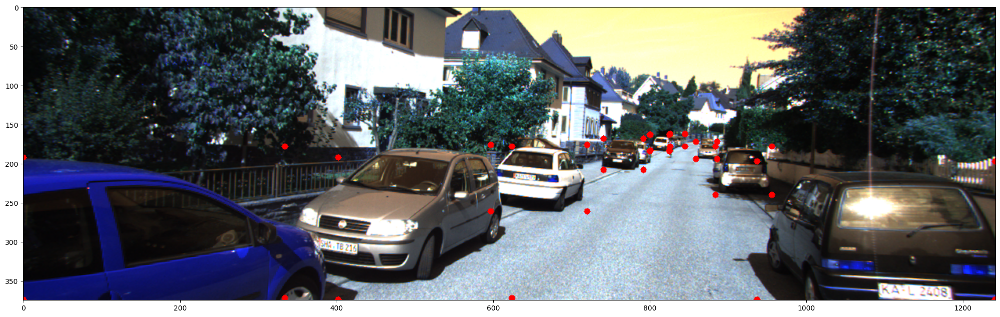

In [29]:
for box in corners:
    for corner in box:
        cv2.circle(img, corner, 1, (255, 0, 0), 5)
        # cv.Circle(img, center, radius, color, thickness=1, lineType=8, shift=0)

plt.imshow(img)

In [30]:
labels[['label'] + [col for col in labels.columns if col.startswith('bbox')]]

,label,bbox_xmin,bbox_ymin,bbox_xmax,bbox_ymax
0,Car,0.00,192.37,402.31,374.00
1,Car,334.85,178.94,624.50,372.04
2,Car,937.29,197.39,1241.00,374.00
3,Car,597.59,176.18,720.90,261.14
4,Car,741.18,168.83,792.25,208.43
5,Car,884.52,178.31,956.41,240.18
6,DontCare,800.38,163.67,825.45,184.07
7,DontCare,859.58,172.34,886.26,194.51
8,DontCare,801.81,163.96,825.20,183.59
9,DontCare,826.87,162.28,845.84,178.86


## Drawing bounding boxes

In [31]:
boxes = labels.apply(lambda x: ((int(x.bbox_xmin), int(x.bbox_ymin)), (int(x.bbox_xmax), int(x.bbox_ymax))), axis=1)

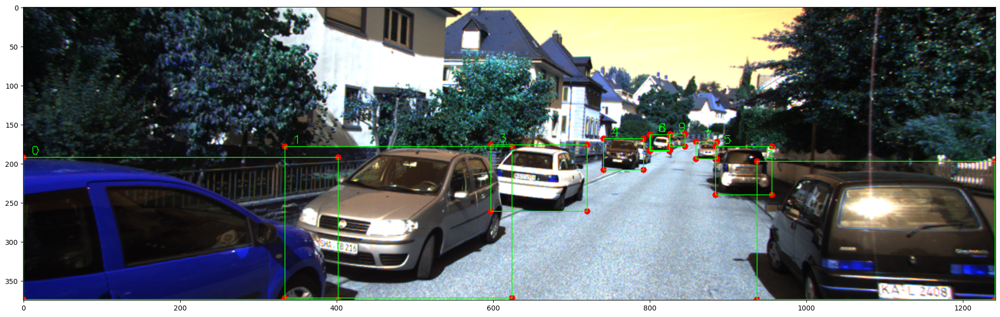

In [32]:
for i, box in enumerate(boxes):
    img = cv2.rectangle(img, box[0], box[1], (0, 255, 0))
    img = cv2.putText(img, str(i), (box[0][0] + 10, box[0][1] - 4) , cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 1)

plt.imshow(img) 